In [1]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose
from tensorflow.keras.layers import Dropout, UpSampling2D
from tensorflow.keras.utils import to_categorical
import numpy as np
import os
import pathlib
import time
import datetime
from matplotlib import pyplot as plt
from IPython import display
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
print(tf.__version__)

2.6.0


In [3]:
gpu = tf.config.list_physical_devices('GPU')[0]
tf.config.experimental.set_memory_growth(gpu, True)

# Download the dataset 

In [4]:
import cv2
from tqdm import tqdm
data_dir = "C:/Users/iaren/PycharmProjects/TextRemoveNN/dataset"
data_dir_train = "C:/Users/iaren/PycharmProjects/TextRemoveNN/dataset/train"
data_dir_test = "C:/Users/iaren/PycharmProjects/TextRemoveNN/dataset/test"

In [5]:
data_dir, data_dir_train, data_dir_test = pathlib.Path(data_dir), pathlib.Path(data_dir_train), pathlib.Path(data_dir_test) 

In [6]:
image_count = len(list(data_dir_train.glob('*.jpg'))) + len(list(data_dir_test.glob('*.jpg')))
print(image_count)

4343


In [7]:
PATH = data_dir.parent/data_dir_train
list(PATH.parent.iterdir())

[WindowsPath('C:/Users/iaren/PycharmProjects/TextRemoveNN/dataset/test'),
 WindowsPath('C:/Users/iaren/PycharmProjects/TextRemoveNN/dataset/train')]

# Prepare the dataset

In [8]:
list_ds_train = tf.data.Dataset.list_files(str(data_dir_train/'*'), shuffle=False)
list_ds_test = tf.data.Dataset.list_files(str(data_dir_test/'*'), shuffle=False)
list_ds_train = list_ds_train.shuffle(image_count, reshuffle_each_iteration=False)
list_ds_test = list_ds_test.shuffle(image_count, reshuffle_each_iteration=False)

In [9]:
def get_label(file_path):
  # Convert the path to a list of path components
  parts = tf.strings.split(file_path, os.path.sep)
  # The second to last is the class-directory
  one_hot = parts[-2] == class_names
  # Integer encode the label
  return tf.argmax(one_hot)

def decode_img(img):
  # Convert the compressed string to a 3D uint8 tensor
  img = tf.io.decode_jpeg(img, channels=3)
  # Resize the image to the desired size
  return tf.image.resize(img, [img_height, img_width])

def process_path(file_path):
  label = get_label(file_path)
  # Load the raw data from the file as a string
  img = tf.io.read_file(file_path)
  img = decode_img(img)
  return img, label

In [10]:
sample_image = tf.io.read_file(str(PATH / '0 (1021).jpg'))
sample_image = tf.io.decode_jpeg(sample_image)
print(sample_image.shape)

(256, 512, 3)


In [11]:
def load(image_file):
  # Read and decode an image file to a uint8 tensor
  image = tf.io.read_file(image_file)
  image = tf.io.decode_jpeg(image)

  # Split each image tensor into two tensors:
  # - one with a real building dataset image
  # - one with an architecture label image 
  w = tf.shape(image)[1]
  w = w // 2
  input_image = image[:, :w, :]
  real_image = image[:, w:, :]

  # Convert both images to float32 tensors
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

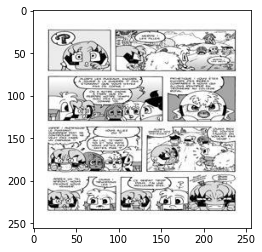

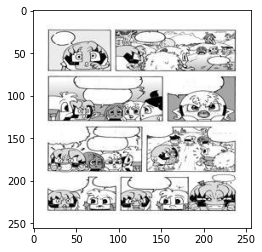

In [12]:
inp, re = load(str(PATH / '0 (1).jpg'))
# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(inp / 255.0)
plt.figure()
plt.imshow(re / 255.0)

In [13]:
BUFFER_SIZE = 2842  # amount of training image 
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [14]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [15]:
@tf.function()
def random_jitter(input_image, real_image):
  input_image, real_image = resize(input_image, real_image, 286, 286)
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

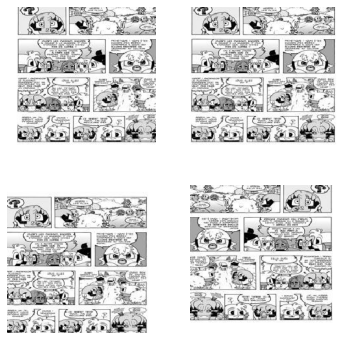

In [16]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i + 1)
  plt.imshow(rj_inp / 255.0)
  plt.axis('off')
plt.show()

In [17]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [18]:
train_dataset = tf.data.Dataset.list_files(str(data_dir_train/'*'))
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE) 

In [19]:
try:
  test_dataset = tf.data.Dataset.list_files(str(data_dir/'test/*'))
except tf.errors.InvalidArgumentError:
  test_dataset = tf.data.Dataset.list_files(str(data_dir/'test/*'))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE) 

# Generator

In [32]:
OUTPUT_CHANNELS = 3

def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=1, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.Activation('relu'))
  
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU(alpha=0.2))

  return result

down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.4))

  result.add(tf.keras.layers.LeakyReLU(alpha=0.2))

  return result

up_model = upsample(3, 3)
up_result = up_model(down_result)
print (up_result.shape)

def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 512)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 512)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 512)
    upsample(512, 4),  # (batch_size, 16, 16, 512)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

generator = Generator()

(1, 128, 128, 3)
(1, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


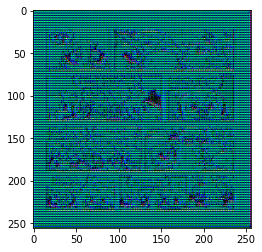

In [33]:
gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

# Discriminator

In [40]:
LAMBDA = 1

loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

In [35]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)
  conv2 = upsample(256, 2)(conv)  # (batch_size, 24, 24, 1024)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv2)

  leaky_relu = tf.keras.layers.LeakyReLU(alpha=0.2)(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  x = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)
  x = tf.keras.layers.BatchNormalization()(x)
  
  x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)

  return tf.keras.Model(inputs=[inp, tar], outputs=x)

discriminator = Discriminator()

In [36]:
discriminator.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
target_image (InputLayer)       [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_15 (Concatenate)    (None, 256, 256, 6)  0           input_image[0][0]                
                                                                 target_image[0][0]               
__________________________________________________________________________________________________
sequential_38 (Sequential)      (None, 128, 128, 64) 71680       concatenate_15[0][0]       

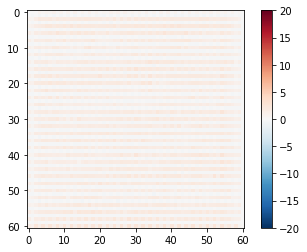

In [37]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

In [41]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [42]:
generator_optimizer = tf.keras.optimizers.RMSprop(2e-4)
discriminator_optimizer = tf.keras.optimizers.RMSprop(2e-4)

checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

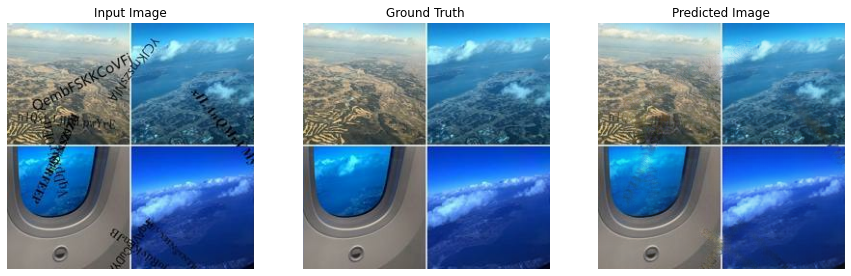

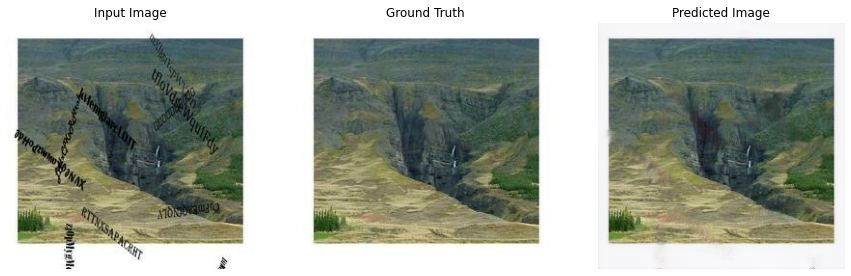

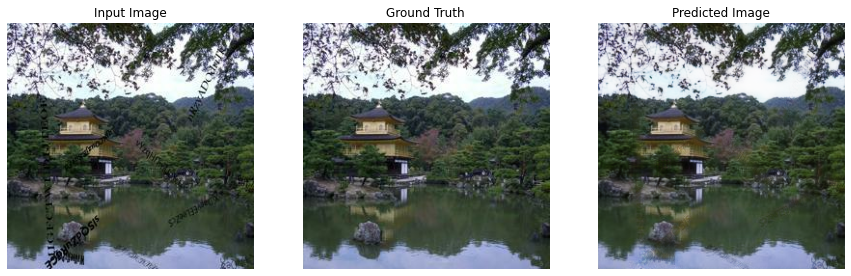

In [22]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

for example_input, example_target in test_dataset.take(3):
  generate_images(generator, example_input, example_target)

# Train

In [64]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

In [58]:
def fit(train_ds, test_ds, steps):
  # example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      # generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)

    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

In [69]:
# %load_ext tensorboard
# %tensorboard --logdir {log_dir}

fit(train_dataset, test_dataset, steps=36000)

Time taken for 1000 steps: 379.68 sec

Step: 35k
....................................................................................................

In [ ]:
# display.IFrame(
#     src="https://tensorboard.dev/experiment/lZ0C6FONROaUMfjYkVyJqw",
#     width="100%",
#     height="1000px")

In [ ]:
ls {checkpoint_dir}

In [ ]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

# Results

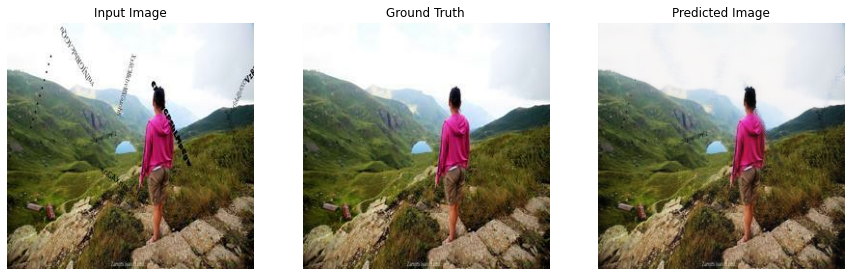

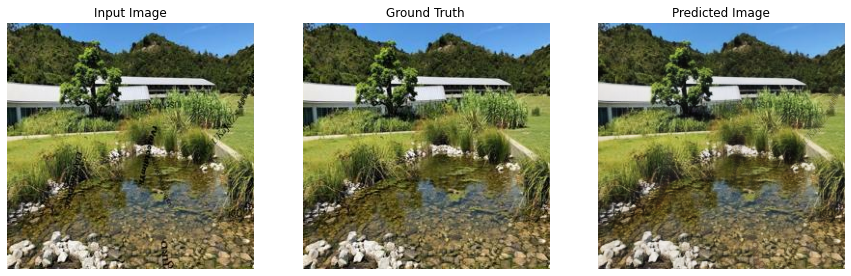

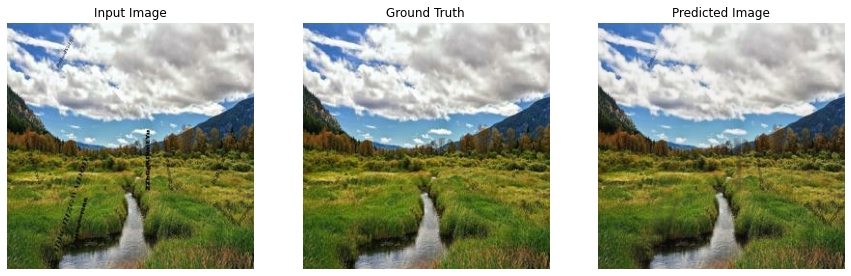

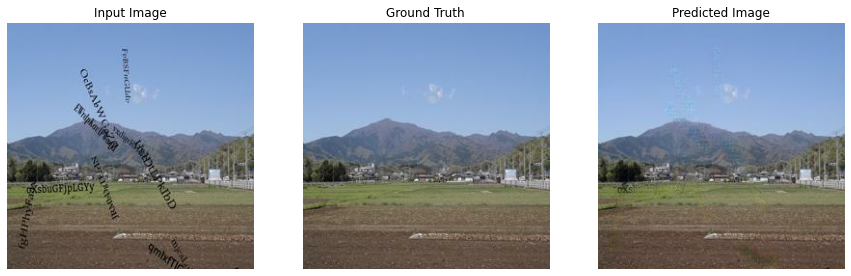

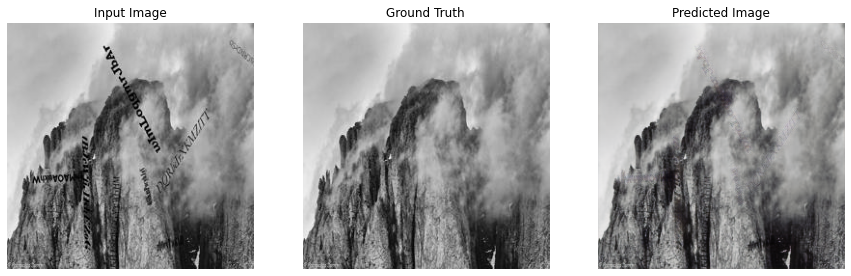

In [59]:
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)

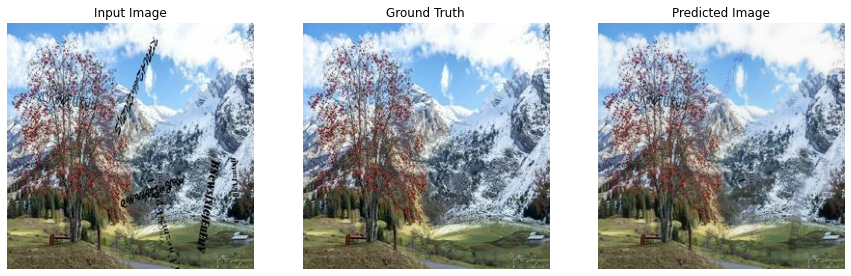

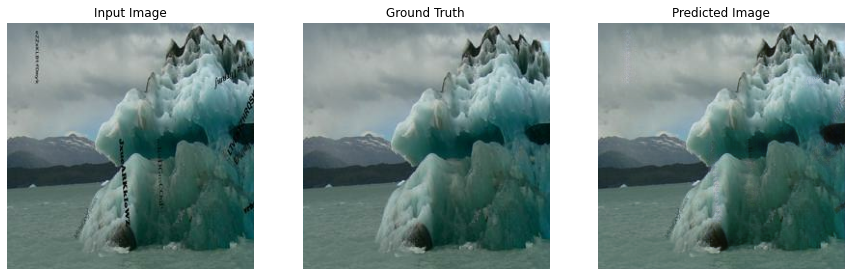

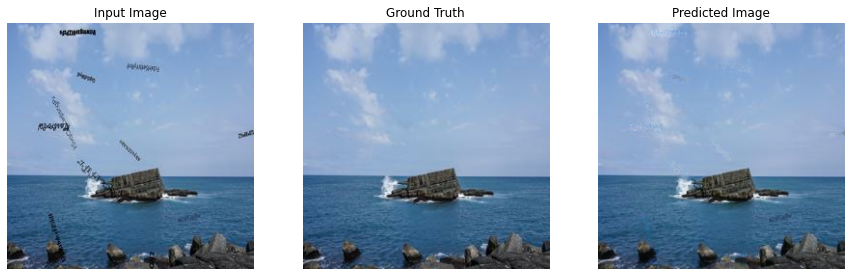

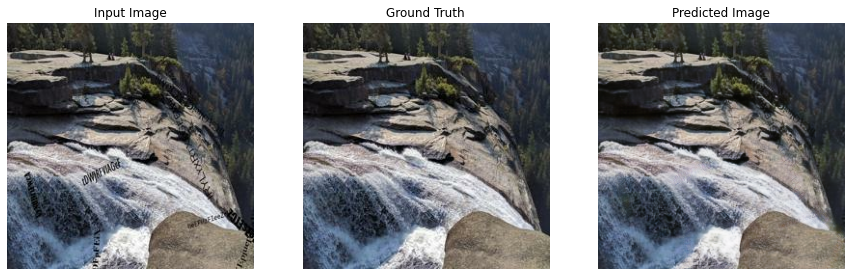

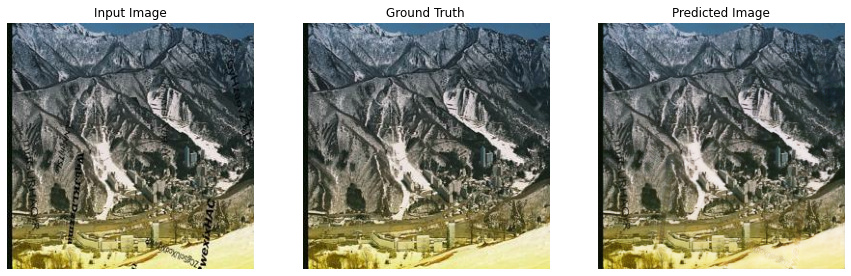

In [98]:
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)

In [103]:
discriminator.compile()
generator.compile()

In [43]:
discriminator.save('discr.h5')
generator.save('gen.h5')

In [1]:
from tensorflow import keras
generator = keras.models.load_model('gen.h5')

4
(256, 256, 3)


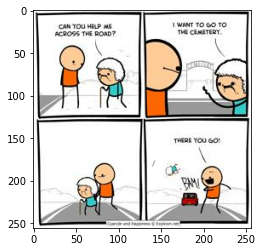

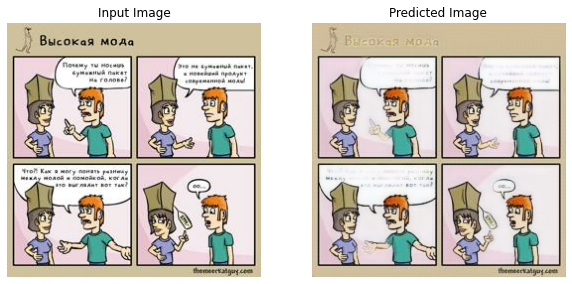

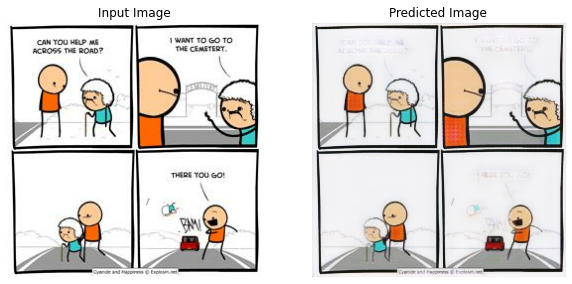

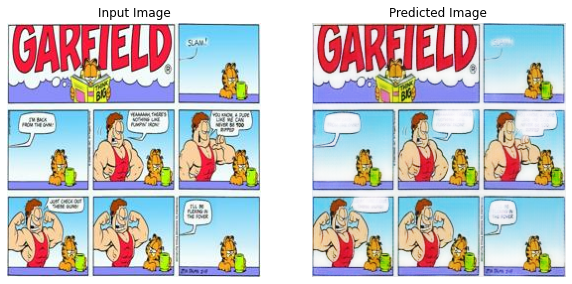

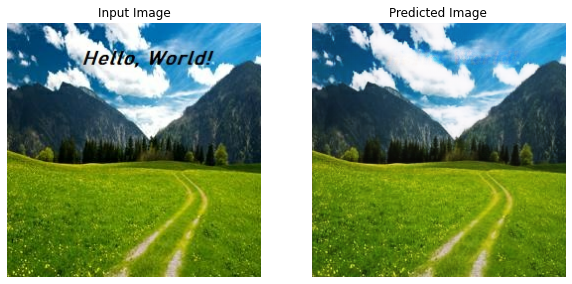

In [15]:
import tensorflow as tf
import pathlib
from matplotlib import pyplot as plt

# IMG_HEIGHT = 256
# IMG_WIDTH = 256
# BATCH_SIZE = 1

data_dir1 = "C:/Users/iaren/Pictures/1"
data_dir1 = pathlib.Path(data_dir1)

image_count1 = len(list(data_dir1.glob('*.jpg')))
print(image_count1)

PATH1 = data_dir1.parent/data_dir1
list(PATH1.parent.iterdir())

list_ds1 = tf.data.Dataset.list_files(str(data_dir1/'*'), shuffle=False)
list_ds1 = list_ds1.shuffle(1, reshuffle_each_iteration=False)

sample_image1 = tf.io.read_file(str(PATH1 / 'aaa.jpg'))
sample_image1 = tf.io.decode_jpeg(sample_image1)
print(sample_image1.shape)

def load1(image_file):
  image = tf.io.read_file(image_file)
  image = tf.io.decode_jpeg(image)

  # Split each image tensor into two tensors:
  # - one with a real building dataset image
  # - one with an architecture label image 
  w = tf.shape(image)[1]
  input_image = image[:, :, :]
  input_image = tf.cast(input_image, tf.float32)
  return input_image

inp1 = load1(str(PATH1 / 'aaa.jpg'))
# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(inp1 / 255.0)

def resize1(input_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  return input_image

def random_crop1(input_image):
  cropped_image = tf.image.random_crop(
      input_image, size=[1, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

def normalize1(input_image):
  input_image = (input_image / 127.5) - 1
  return input_image

@tf.function()
def random_jitter1(input_image):
  input_image = resize1(input_image, 286, 286)
  input_image = random_crop1(input_image)

  if tf.random.uniform(()) > 0.5:
    input_image = tf.image.flip_left_right(input_image)

  return input_image

def load_image1(input_image):
  input_image = load1(input_image)
  input_image = resize1(input_image, IMG_HEIGHT, IMG_WIDTH)
  input_image = normalize1(input_image)
  return input_image
    
test_dataset1 = tf.data.Dataset.list_files(str(data_dir1/'*'))
test_dataset1 = test_dataset1.map(load_image1)
test_dataset1 = test_dataset1.batch(BATCH_SIZE)   

def generate_image(model, test_input):
  
  prediction = model(test_input, training=True)
  plt.figure(figsize=(10, 10))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()


for example_input in test_dataset1.take(4):
   generate_image(generator, example_input)

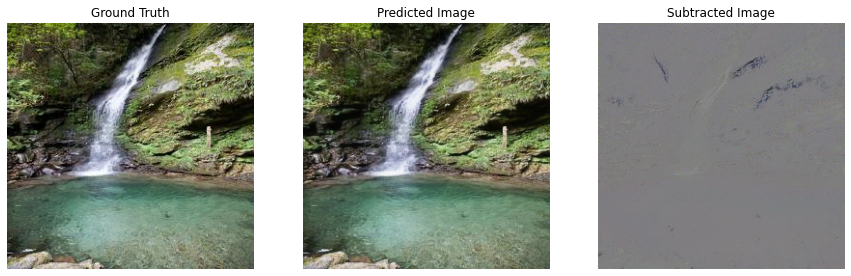

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


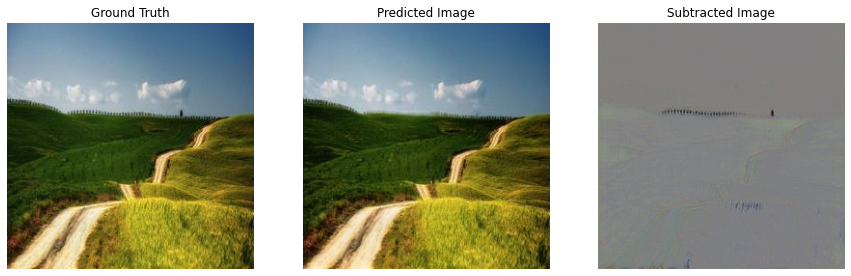

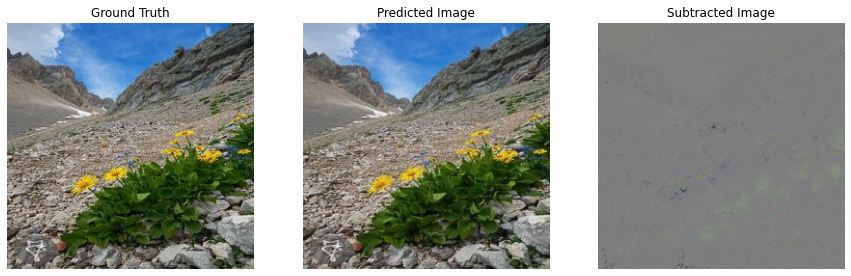

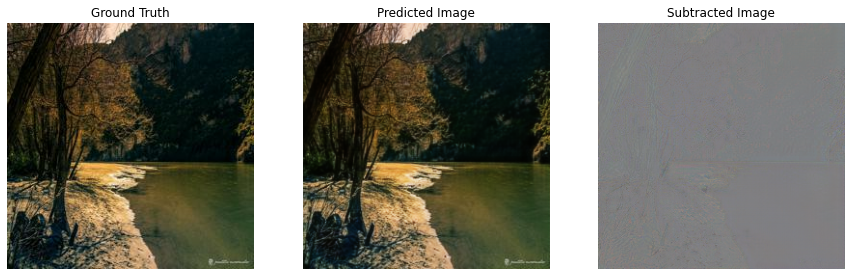

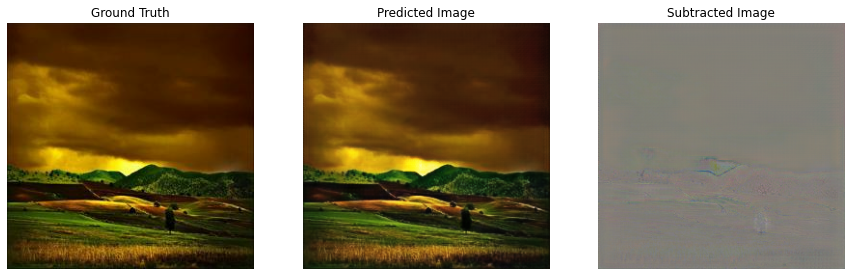

In [108]:
def subtract_image(model, test_input):
  
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  subtracted = tf.subtract(test_input, prediction)

  display_list = [test_input[0], prediction[0], subtracted[0]]
  title = ['Ground Truth', 'Predicted Image', 'Subtracted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

for example_input, example_target in test_dataset.take(5):
    subtract_image(generator, example_target)